In [1]:
import matplotlib.pyplot as plt
import torch
import torchvision

from torch import nn
from torchvision import transforms

import os
from PIL import Image

In [2]:
image_dir = '/kaggle/input/hgsvdku/image pro'
output_dir = '/kaggle/working/' 
os.makedirs(output_dir, exist_ok=True)

In [8]:
IMG_SIZE = 224

# Initialize variables to accumulate pixel values
num_images = 0
total_sum = torch.zeros(3)
total_squared_sum = torch.zeros(3)

# Loop through the images and accumulate pixel values
for file_name in os.listdir(image_dir):
    transform = transforms.Compose([
        transforms.Resize([IMG_SIZE, IMG_SIZE]),
        transforms.RandomHorizontalFlip(),
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
        transforms.RandomRotation(degrees=15),
        transforms.ToTensor()
    ])
    
    image = Image.open(os.path.join(image_dir, file_name))
    image_tensor = transform(image)
    num_images += 1
    total_sum += image_tensor.sum((1, 2))
    total_squared_sum += (image_tensor ** 2).sum((1, 2))

# Calculate mean and variance
mean = total_sum / (num_images * IMG_SIZE * IMG_SIZE)
variance = (total_squared_sum / (num_images * IMG_SIZE * IMG_SIZE)) - (mean ** 2)

# Calculate standard deviation using the variance
std = torch.sqrt(variance)

print("Calculated Mean:", mean)
print("Calculated Standard Deviation:", std)

# Normalize transform using calculated mean and std
normalize_transform = transforms.Normalize(mean=mean, std=std)

# Loop through the images and apply normalization
normalized_images = []
for file_name in os.listdir(image_dir):
    image = Image.open(os.path.join(image_dir, file_name))
    normalized_image = normalize_transform(transform(image))
    normalized_images.append(normalized_image)

print(f"Manually created transforms: {transform}")

Calculated Mean: tensor([0.4216, 0.4266, 0.3706])
Calculated Standard Deviation: tensor([0.2711, 0.2693, 0.2770])
Manually created transforms: Compose(
    Resize(size=[224, 224], interpolation=bilinear, max_size=None, antialias=warn)
    RandomHorizontalFlip(p=0.5)
    ColorJitter(brightness=(0.8, 1.2), contrast=(0.8, 1.2), saturation=(0.8, 1.2), hue=(-0.1, 0.1))
    RandomRotation(degrees=[-15.0, 15.0], interpolation=nearest, expand=False, fill=0)
    ToTensor()
)


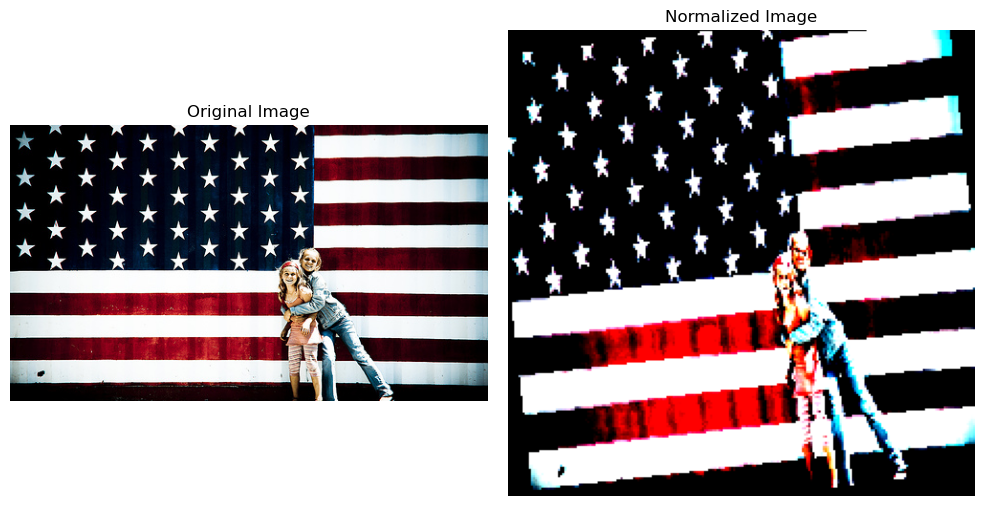

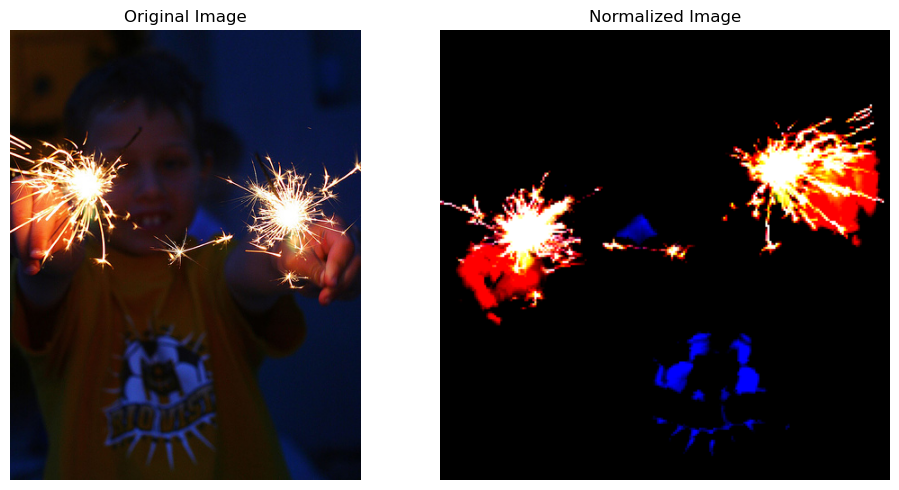

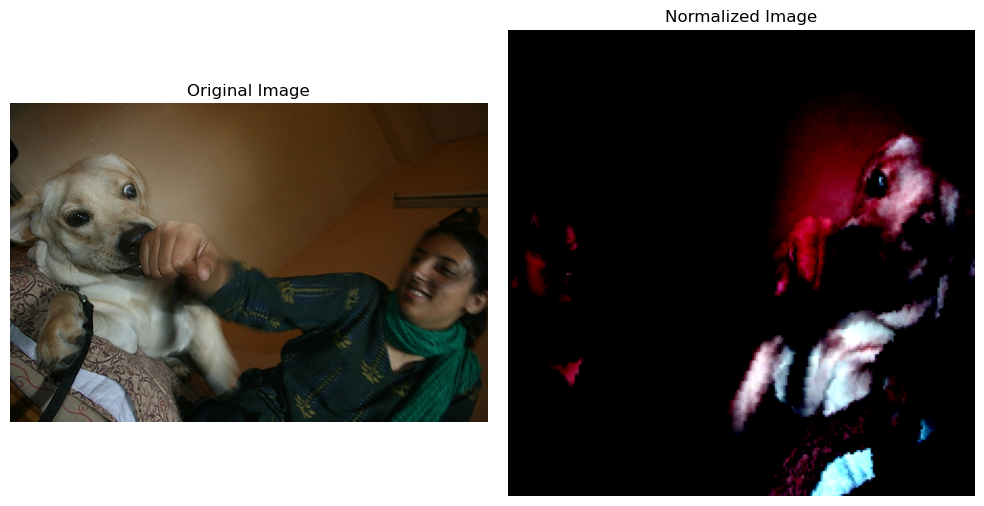

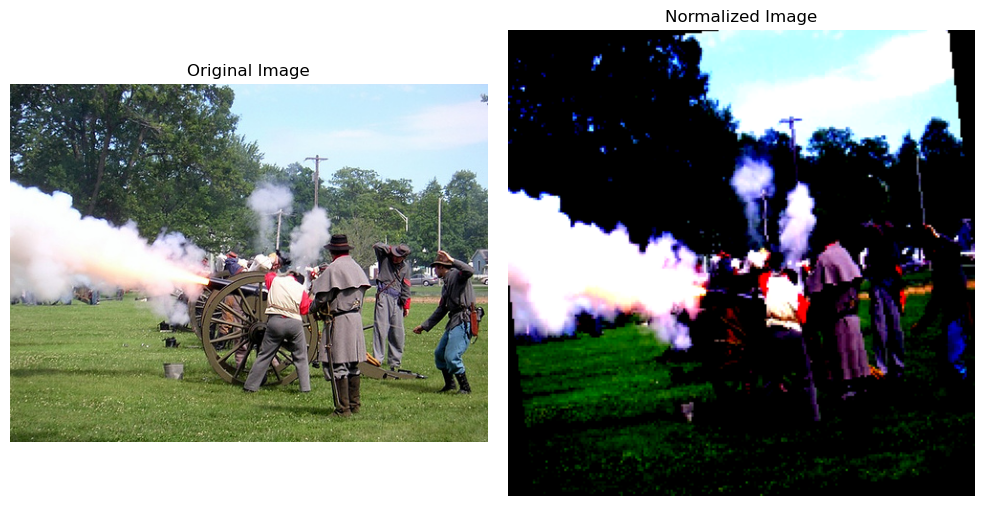

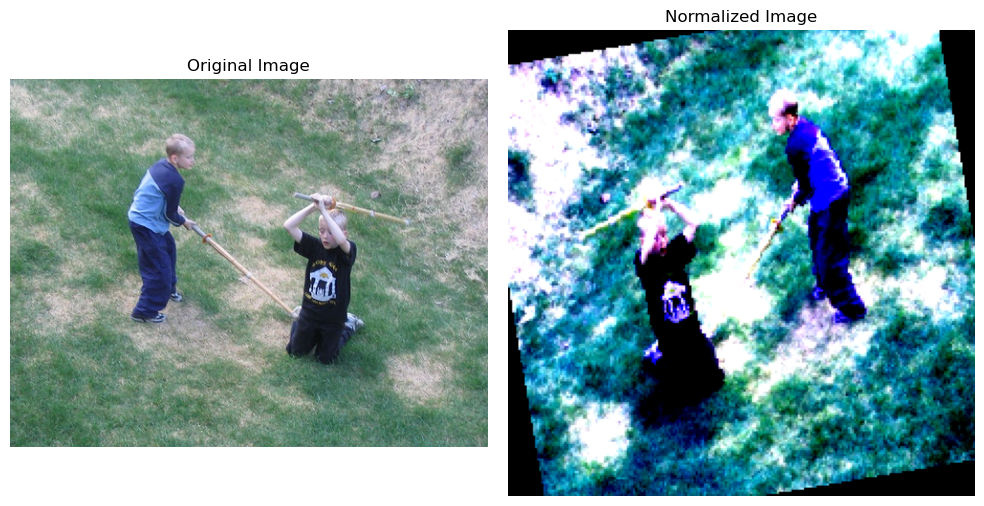

...

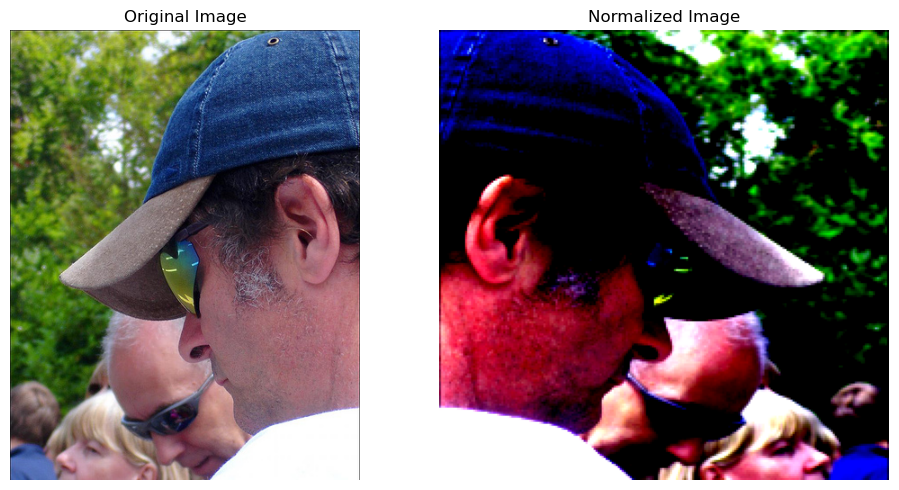

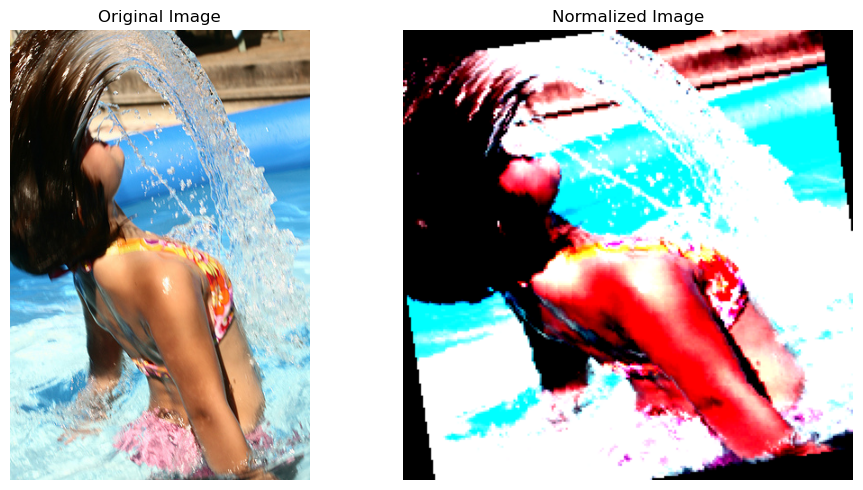

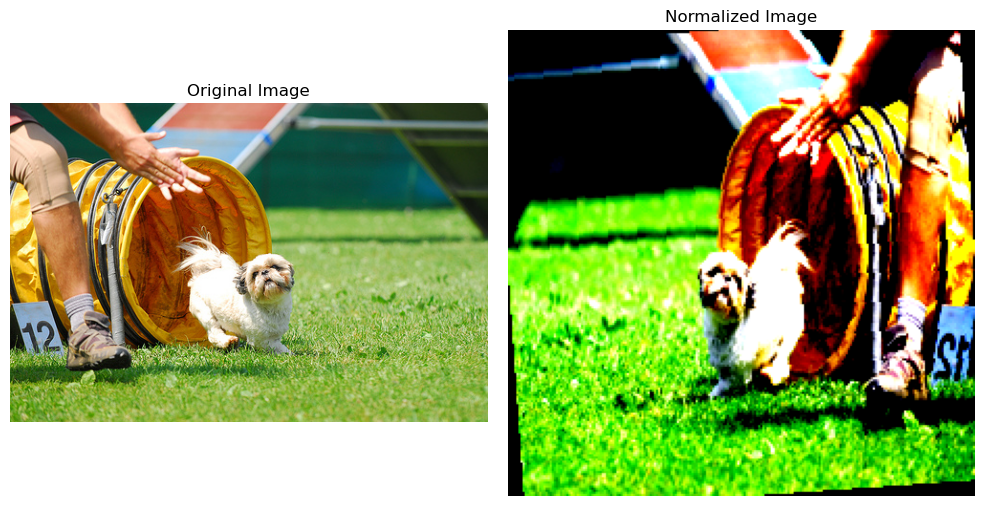

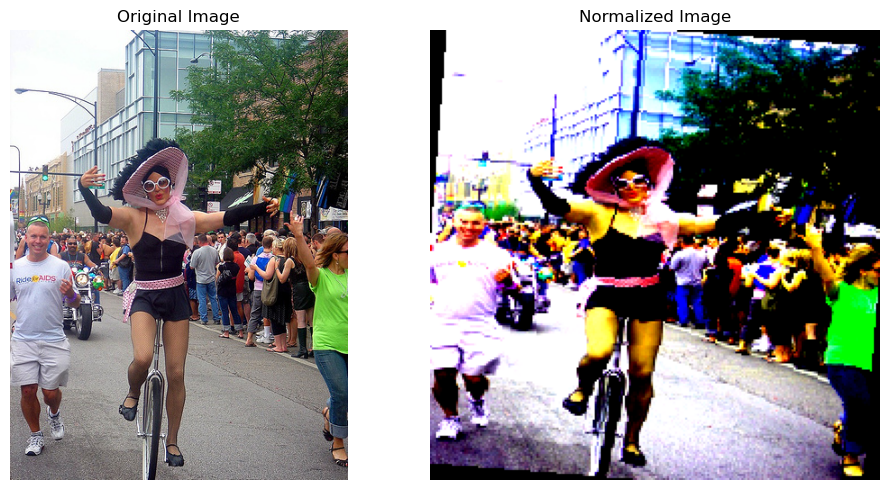

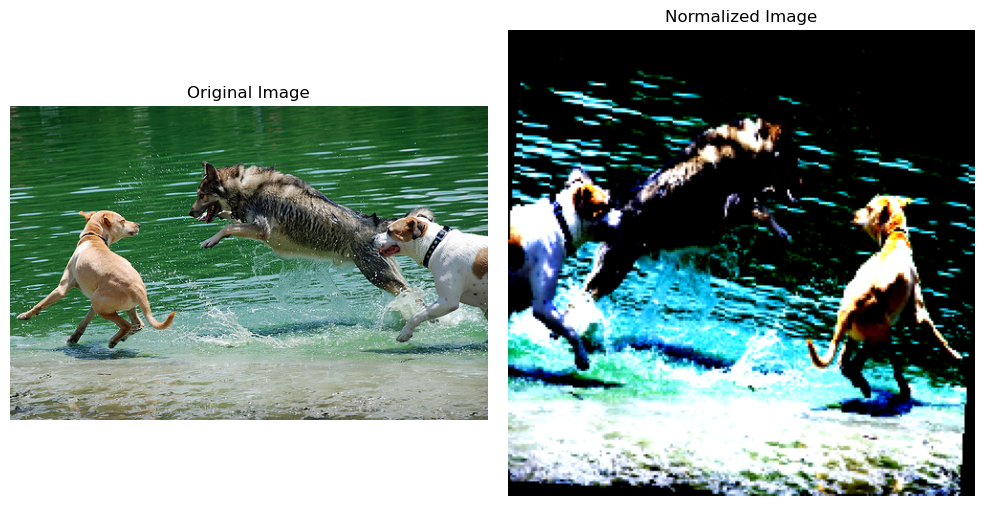

In [9]:
# Save and display a few original and normalized images
num_images_to_display = 20  # Number of images to display
for i in range(num_images_to_display):
    original_image = Image.open(os.path.join(image_dir, os.listdir(image_dir)[i]))
    normalized_image = normalized_images[i]
    
    # Save normalized image
    torchvision.utils.save_image(normalized_image, os.path.join(output_dir, f'normalized_image_{i}.png'))

    # Display original and normalized images
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.title('Original Image')
    plt.imshow(original_image)
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.title('Normalized Image')
    plt.imshow(normalized_image.numpy().transpose(1, 2, 0))
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()